In [2]:
using CSV
using Compose, Cairo, Fontconfig
using DataFrames
using DataFramesMeta
using Dates
using Distributions
using HypothesisTests
using Plots
using Statistics
using StatsPlots

In [43]:
folder = joinpath(@__DIR__(), "data")
df = CSV.read(joinpath(folder, "nanaimo_ridership_fall_2023.csv"), DataFrames.DataFrame);

In [94]:
first(df, 5)

Row,route,trip_id,date,planned_start_time,planned_duration_seconds,start_delay_seconds,end_delay_seconds,total_boardings,route_class,day,direction,is_holiday,is_weekday,primary_delay_seconds,primary_delay_pct,planned_start_hour
,Int64,Int64,Date,Time,Int64,Int64,Int64,Int64,String31?,String15,String15,Bool,Bool,Int64,Float64,Int64
1,1,73449258,2023-10-13,10:30:00,1740,62,-118,11,Local Transit (Ridership),Friday,Outbound,false,false,-180,-0.103448,10
2,1,73420181,2023-09-18,10:33:00,1560,26,-26,12,Local Transit (Ridership),Monday,Inbound,false,true,-52,-0.0333333,10
3,1,73448776,2023-10-19,18:05:00,1740,12,-133,18,Local Transit (Ridership),Thursday,Outbound,false,true,-145,-0.0833333,18
4,1,73448308,2023-11-14,18:08:00,1560,23,-67,19,Local Transit (Ridership),Tuesday,Inbound,false,true,-90,-0.0576923,18
5,1,73448889,2023-10-26,16:20:00,1740,12,-134,21,Local Transit (Ridership),Thursday,Outbound,false,true,-146,-0.083908,16


In [5]:
df.direction = [(d in ["Inbound", "North"] ? false : true) for d in df.direction];

In [44]:
holidays = [
    Date(2023, 9, 4), # labour day
    Date(2023, 9, 30), # truth and reconciliation
    Date(2023, 10, 9), # thanksgiving
    Date(2023, 11, 11), # remembrance day
]

df.is_holiday = [date in holidays for date in df.date];

In [45]:
df.is_weekday = Dates.dayofweek.(df.date) .< 5;

In [46]:
df.primary_delay_seconds = df.end_delay_seconds - df.start_delay_seconds;

In [47]:
df.primary_delay_pct = df.primary_delay_seconds ./ df.planned_duration_seconds;

In [96]:
df.planned_start_hour = Dates.hour.(df.planned_start_time)
df[df.planned_start_hour .== 0, :planned_start_hour] .= 24;

In [32]:
# unique(df.route_class)
unique(df[coalesce.([
    class in ["Frequent Transit", "Local Transit (Ridership)"] for class in df.route_class
    ], false), :route])

9-element Vector{Int64}:
  1
 30
 40
  5
 50
  6
  7
  8
 91

In [70]:
x = df.primary_delay_seconds[.!df.is_holiday .& df.is_weekday] ./ 60
y = df.start_delay_seconds[.!df.is_holiday .& df.is_weekday] ./ 60;

In [179]:
Distributions.fit(Distributions.Normal, x)

Normal{Float64}(μ=-0.12215451341206696, σ=4.248310892139501)

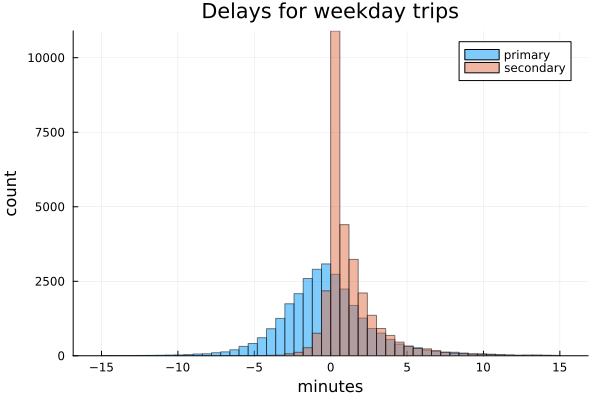

In [107]:
histplot = histogram(
    x,
    bins=range(-15, 15, length=51),
    label="primary",
    alpha=0.5,
    xlabel="minutes",
    ylabel="count",
    title="Delays for weekday trips",
)
histogram!(
    y,
    bins=range(-15, 15, length=51),
    label="secondary",
    alpha=0.5
)
# savefig(histplot, "imgs\\weekday_delay_histogram.png")

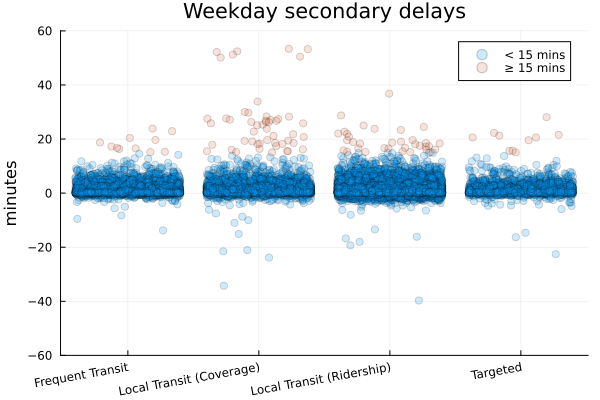

In [178]:
secondary_plot = @df weekday_df[.!ismissing.(weekday_df.route_class), :] dotplot(
    :route_class,
    :start_delay_seconds ./ 60,
    group=:start_delay_seconds .>= 15 * 60,
    mode=:uniform,
    alpha=0.2,
    ylims=(-60, 60),
    label=["< 15 mins" "≥ 15 mins"],
    ylabel="minutes",
    xrotation=10,
    title="Weekday secondary delays"
)
# savefig(secondary_plot, "imgs\\weekday_secondary_delay_dotplot.png")

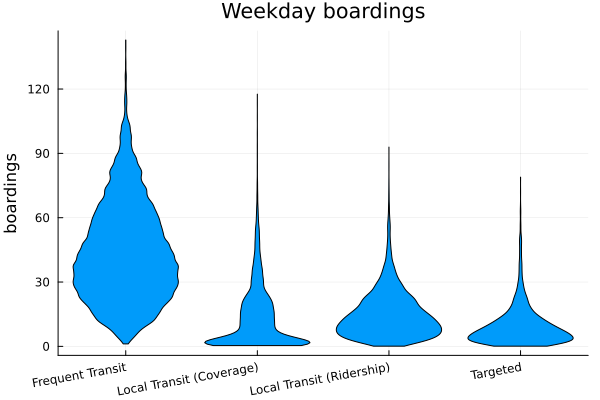

In [150]:
ridership_plot = @df weekday_df[.!ismissing.(weekday_df.route_class), :] violin(
    :route_class,
    :total_boardings,
    label="",
    ylabel="boardings",
    xrotation=10,
    title="Weekday boardings"
)
# savefig(ridership_plot, "imgs\\weekday_boardings_violin.png")

In [145]:
weekday_df = df[.!df.is_holiday .& df.is_weekday, :];

In [163]:
route_time_direction_df = DataFrames.groupby(weekday_df, [:route, :planned_start_hour, :direction]);
class_time_df = DataFrames.groupby(weekday_df, [:route_class, :planned_start_hour]);
class_time_direction_df = DataFrames.groupby(weekday_df, [:route_class, :planned_start_hour, :direction]);
time_direction_df = DataFrames.groupby(weekday_df, [:planned_start_hour, :direction]);

In [166]:
combined_df = combine(
    class_time_df,
    :total_boardings => mean => :ridership_μ,
    :total_boardings => std => :ridership_σ,
    :primary_delay_seconds => mean => :primary_μ,
    :start_delay_seconds => mean => :secondary_μ,
    :primary_delay_seconds => std => :primary_σ,
    :start_delay_seconds => std => :secondary_σ
)

Row,route_class,planned_start_hour,ridership_μ,ridership_σ,primary_μ,secondary_μ,primary_σ,secondary_σ
,String31?,Int64,Float64,Float64,Float64,Float64,Float64,Float64
1,Local Transit (Ridership),6,10.2396,8.18995,-52.7483,19.2771,153.843,126.284
2,Local Transit (Ridership),7,18.137,12.9834,-7.70143,55.1431,131.246,96.1374
3,Local Transit (Ridership),8,16.1045,8.88531,-26.3671,113.448,223.393,157.32
4,Local Transit (Ridership),9,12.947,7.65114,-94.6418,77.7944,182.377,116.971
5,Local Transit (Ridership),10,14.8561,7.85724,-47.4113,46.2892,162.401,86.3211
6,Local Transit (Ridership),11,15.7037,7.63307,-48.7311,72.2059,159.837,113.779
7,Local Transit (Ridership),12,16.8181,8.53923,-79.8053,94.855,181.465,142.608
8,Local Transit (Ridership),13,19.5922,11.656,-36.3298,75.8051,173.766,134.422
9,Local Transit (Ridership),14,24.9125,14.3022,55.986,75.2719,170.493,119.95


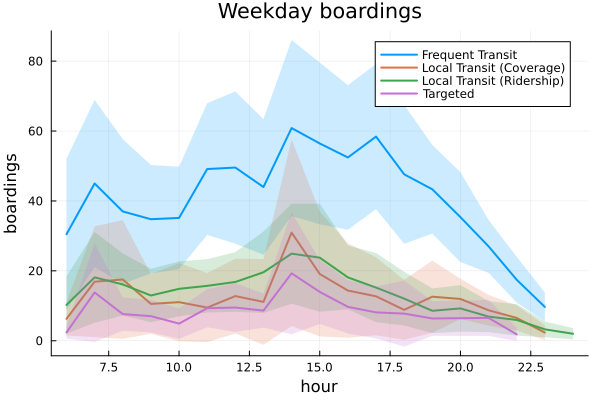

In [169]:
hourly_ridership_plot = @df combined_df[.!ismissing.(combined_df.route_class), :] plot(
    :planned_start_hour,
    :ridership_μ,
    ribbon=:ridership_σ,
    lw=2,
    fillalpha=0.2,
    group=:route_class,
    xlabel="hour",
    ylabel="boardings",
    title="Weekday boardings"
)
# savefig(hourly_ridership_plot, "imgs\\weekday_hourly_boardings.png")

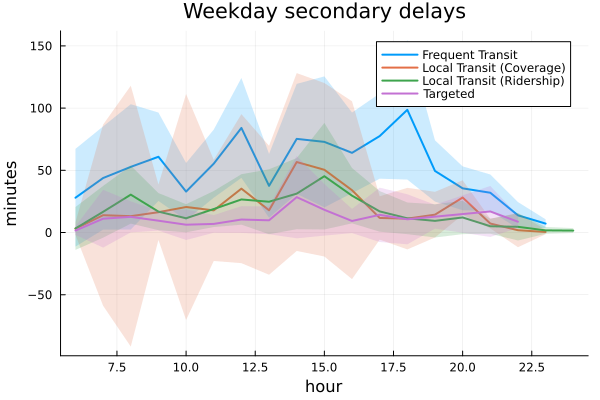

In [172]:
hourly_delay_plot = @df combined_df[.!ismissing.(combined_df.route_class), :] plot(
    :planned_start_hour,
    :secondary_μ ./ 60 .* :ridership_μ,
    ribbon=:secondary_σ ./ 60 .* :ridership_σ,
    lw=2,
    fillalpha=0.2,
    group=:route_class,
    xlabel="hour",
    ylabel="minutes",
    title="Weekday secondary delays"
)
# savefig(secondary_plot, "imgs\\weekday_local-r_secondary_delays.png")